In [1]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)

Torch version: 2.0.0+cu117


In [2]:
import clip
clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [3]:
model, preprocess = clip.load("ViT-B/32")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


In [4]:
model, preprocess

(CLIP(
   (visual): VisionTransformer(
     (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
     (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
     (transformer): Transformer(
       (resblocks): Sequential(
         (0): ResidualAttentionBlock(
           (attn): MultiheadAttention(
             (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
           )
           (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
           (mlp): Sequential(
             (c_fc): Linear(in_features=768, out_features=3072, bias=True)
             (gelu): QuickGELU()
             (c_proj): Linear(in_features=3072, out_features=768, bias=True)
           )
           (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
         )
         (1): ResidualAttentionBlock(
           (attn): MultiheadAttention(
             (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, 

In [5]:
token = clip.tokenize("Hello World!")
token.shape

torch.Size([1, 77])

In [6]:
import os
import skimage
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse", 
    "coffee": "a cup of coffee on a saucer"
}

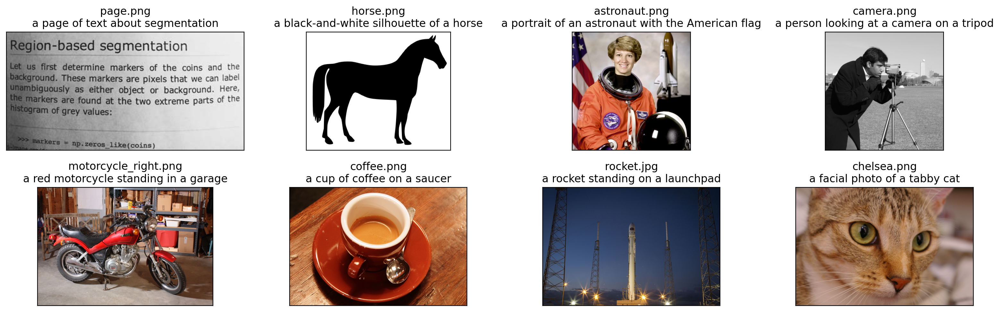

In [7]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")
  
    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


In [8]:
for i in range(len(images)):
    print(images[i].shape, texts[i])

torch.Size([3, 224, 224]) a page of text about segmentation
torch.Size([3, 224, 224]) a black-and-white silhouette of a horse
torch.Size([3, 224, 224]) a portrait of an astronaut with the American flag
torch.Size([3, 224, 224]) a person looking at a camera on a tripod
torch.Size([3, 224, 224]) a red motorcycle standing in a garage
torch.Size([3, 224, 224]) a cup of coffee on a saucer
torch.Size([3, 224, 224]) a rocket standing on a launchpad
torch.Size([3, 224, 224]) a facial photo of a tabby cat


In [9]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

In [10]:
image_input.shape, text_tokens.shape

(torch.Size([8, 3, 224, 224]), torch.Size([8, 77]))

In [11]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

In [12]:
image_features.shape, text_features.shape

(torch.Size([8, 512]), torch.Size([8, 512]))

In [13]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)

In [14]:
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T
similarity.shape

(8, 8)

Text(0.5, 1.0, 'Cosine similarity between text and image features')

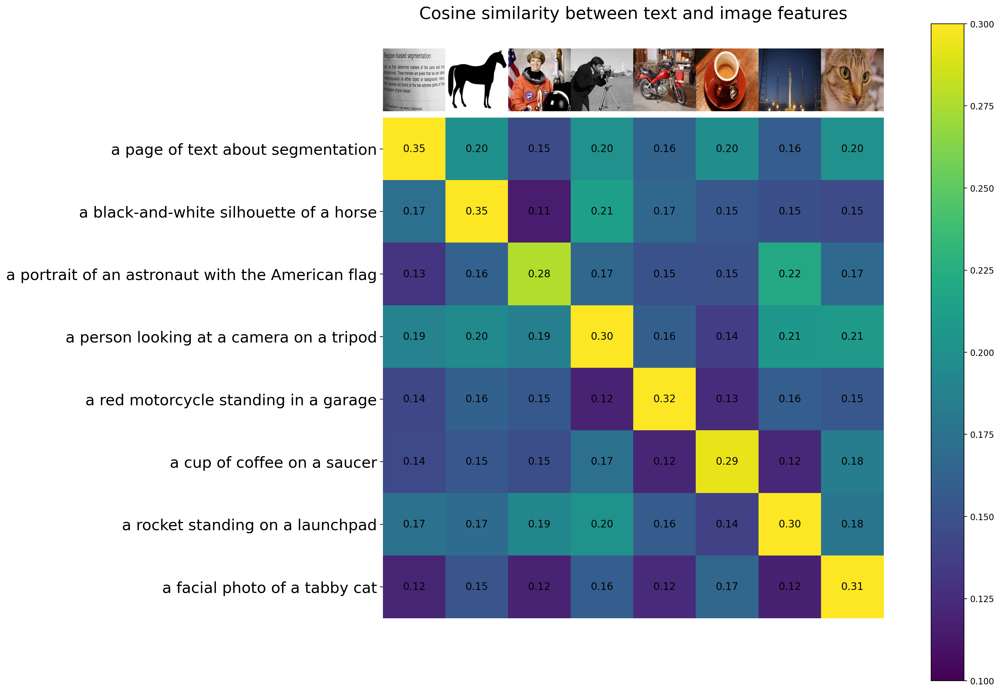

In [15]:
count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features", size=20)

In [16]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_May__3_18:49:52_PDT_2022
Cuda compilation tools, release 11.7, V11.7.64
Build cuda_11.7.r11.7/compiler.31294372_0
torch:  2.0 ; cuda:  cu117
detectron2: 0.6


In [17]:
import os
import sys
import logging
import argparse
os.environ["DATASET"] = "../datasets"

pth = '/'.join(sys.path[0].split('/')[:-1])
sys.path.insert(0, pth)

from pprint import pprint
import numpy as np
np.random.seed(1)

home_dir = os.path.abspath(os.getcwd()+"/../")
sys.path.append(home_dir)
print(home_dir)

import warnings
warnings.filterwarnings(action='ignore')
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

from hdecoder.BaseModel import BaseModel
from hdecoder import build_model
from utils.distributed import init_distributed
from utils.arguments import load_opt_from_config_files, load_config_dict_to_opt

/home/djjin/Mygit/X-Decoder


Invalid MIT-MAGIC-COOKIE-1 key

In [18]:
from utils.arguments import load_vcoco_opt_command, load_vcoco_parser

cmdline_args = load_vcoco_parser()
cmdline_args.conf_files = [os.path.join(home_dir, "configs/hdecoder/vcoco.yaml")]
# cmdline_args.overrides = ['WEIGHT', 'true', 'RESUME_FROM', '../checkpoints/xdecoder_focalt_best_openseg.pt'] 
cmdline_args.overrides = ['DONT_LOAD_MODEL', 'false', 'PYLEARN_MODEL', '../data/output/test/00062100/default/raw_model_states.pt'] 

opt = load_vcoco_opt_command(cmdline_args)
opt = init_distributed(opt)

In [19]:
opt

{'PIPELINE': 'HDecoderPipeline',
 'TRAINER': 'hdecoder',
 'SAVE_DIR': 'data/output/test',
 'base_path': '../',
 'WANDB': True,
 'AUX_LOSS': True,
 'RESUME': False,
 'WEIGHT': False,
 'RESET_DATA_LOADER': False,
 'RESUME_FROM': '',
 'PYLEARN_MODEL': '../data/output/test/00062100/default/raw_model_states.pt',
 'DONT_LOAD_MODEL': False,
 'LOG_EVERY': 10,
 'FIND_UNUSED_PARAMETERS': False,
 'FP16': False,
 'PORT': '2222',
 'LOADER': {'JOINT': True, 'KEY_DATASET': 'coco'},
 'VERBOSE': True,
 'MODEL': {'NAME': 'hoi_model',
  'HEAD': 'hoi_head',
  'TYPE': 'small',
  'MASK_ON': False,
  'KEYPOINT_ON': False,
  'LOAD_PROPOSALS': False,
  'BACKBONE': {'NAME': 'focal_dw',
   'PRETRAINED': '',
   'LOAD_PRETRAINED': False,
   'FOCAL': {'PRETRAIN_IMG_SIZE': 224,
    'PATCH_SIZE': 4,
    'EMBED_DIM': 96,
    'DEPTHS': [2, 2, 6, 2],
    'FOCAL_LEVELS': [3, 3, 3, 3],
    'FOCAL_WINDOWS': [3, 3, 3, 3],
    'DROP_PATH_RATE': 0.3,
    'MLP_RATIO': 4.0,
    'DROP_RATE': 0.0,
    'PATCH_NORM': True,
    'USE

In [20]:
opt['VCOCO']['TEST']['BATCH_SIZE_TOTAL'] = 1

In [21]:
from datasets.build import build_eval_dataloader
test_data_loader = build_eval_dataloader(opt)
dataset_names = opt['DATASETS']['TEST']

INFO:detectron2.data.common:Serializing 4946 elements to byte tensors and concatenating them all ...
INFO:detectron2.data.common:Serialized dataset takes 3.69 MiB


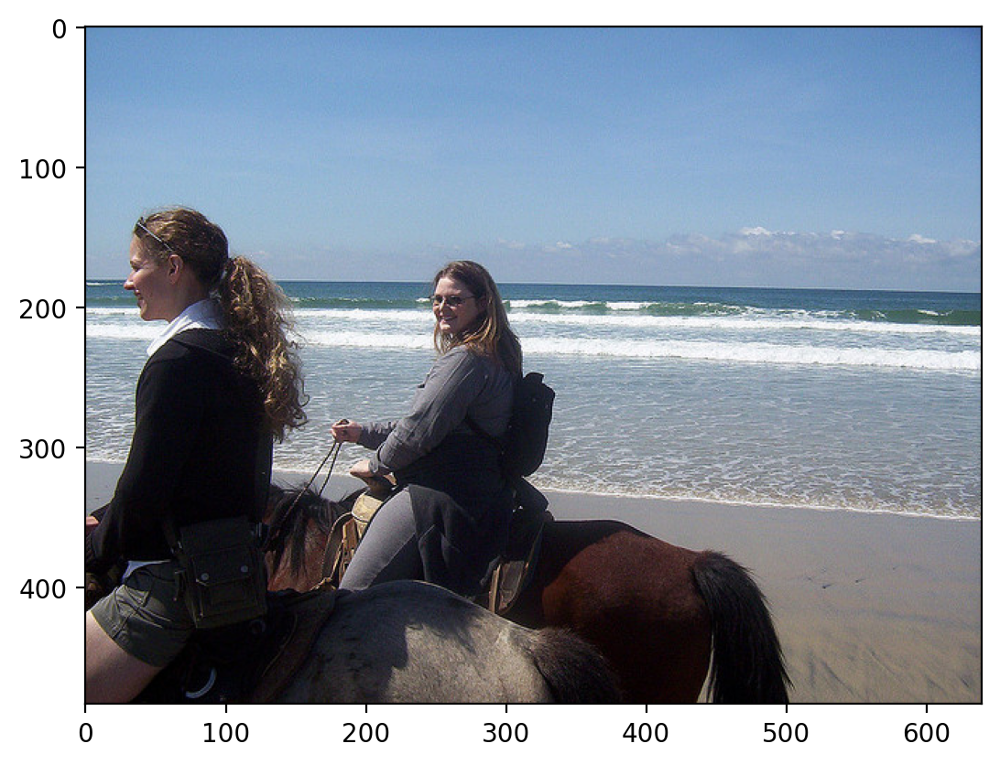

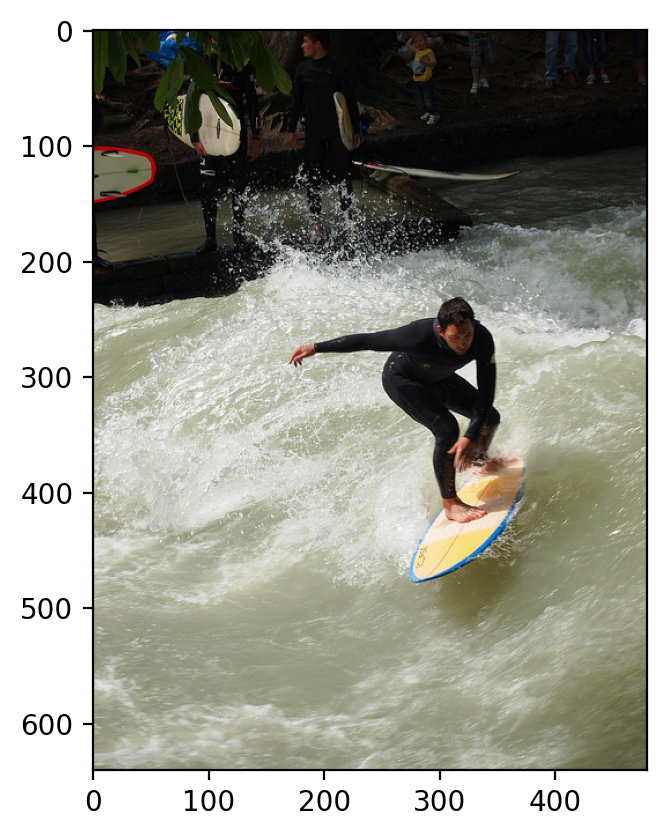

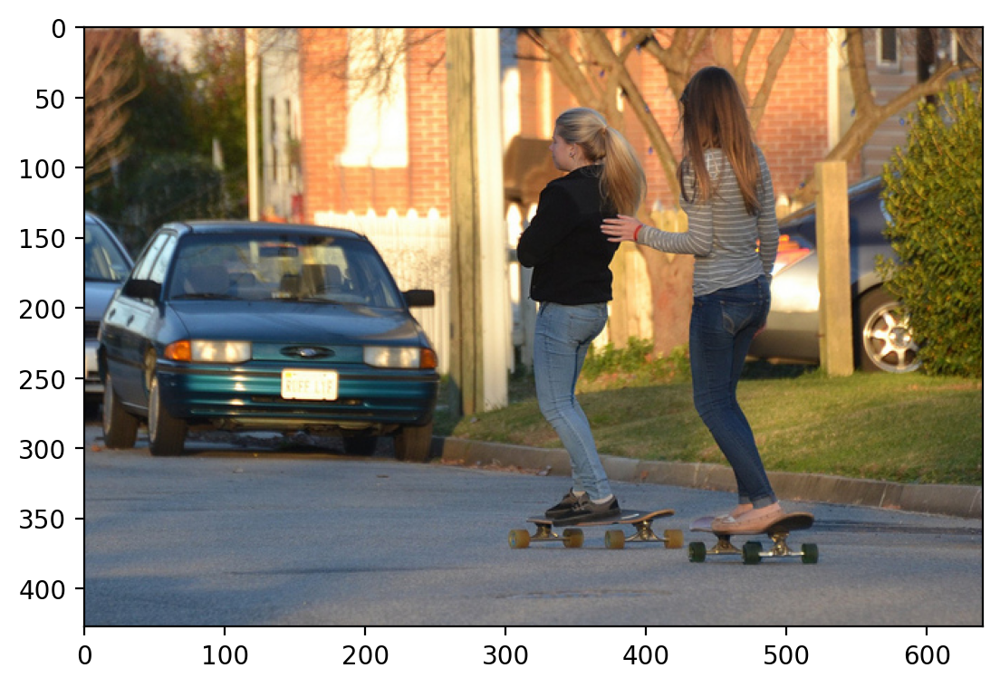

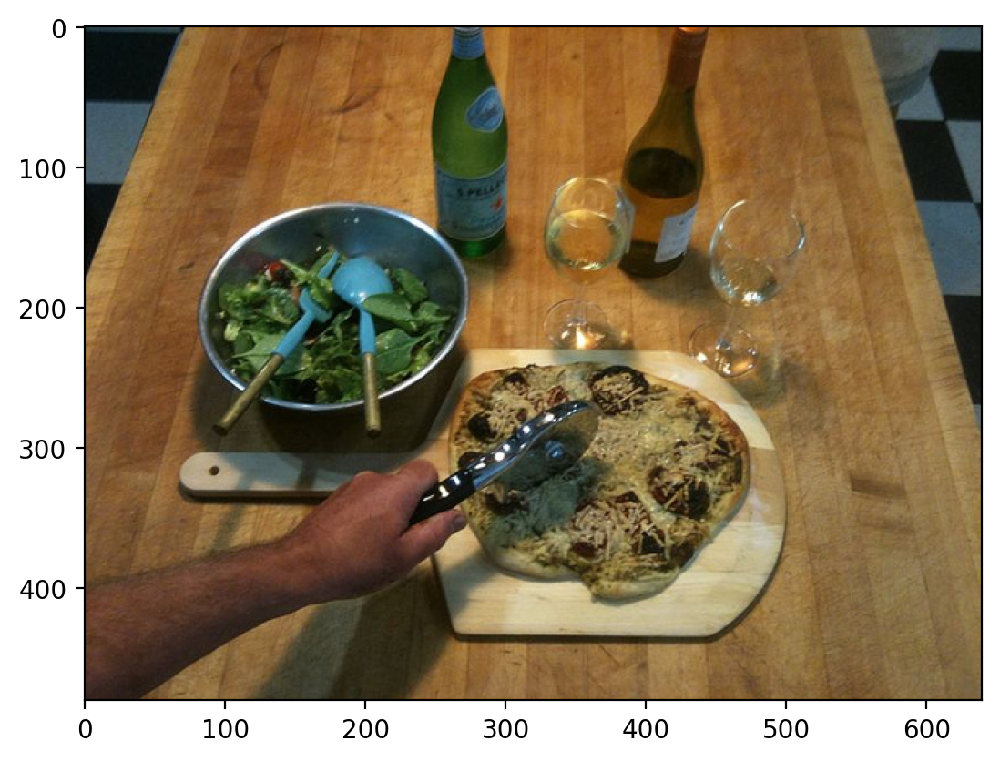

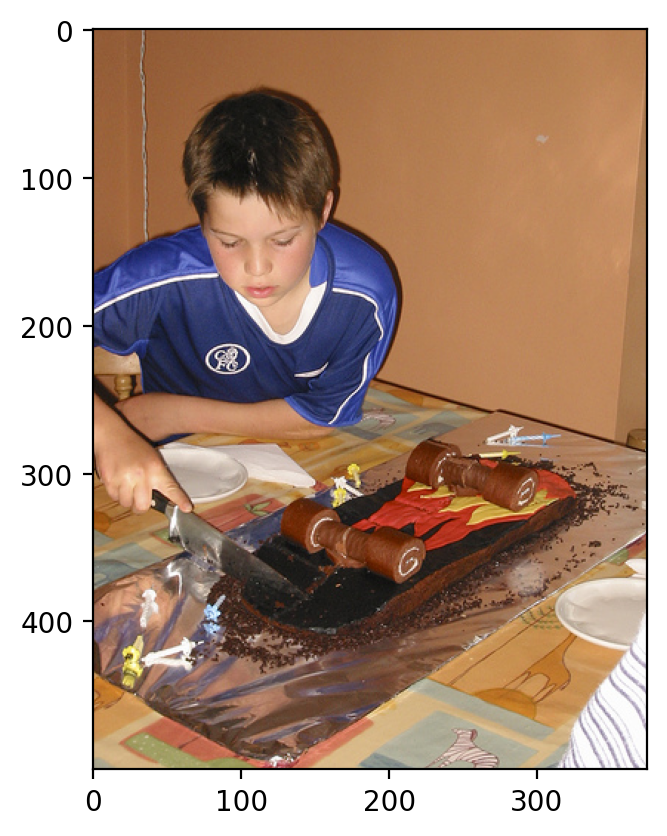

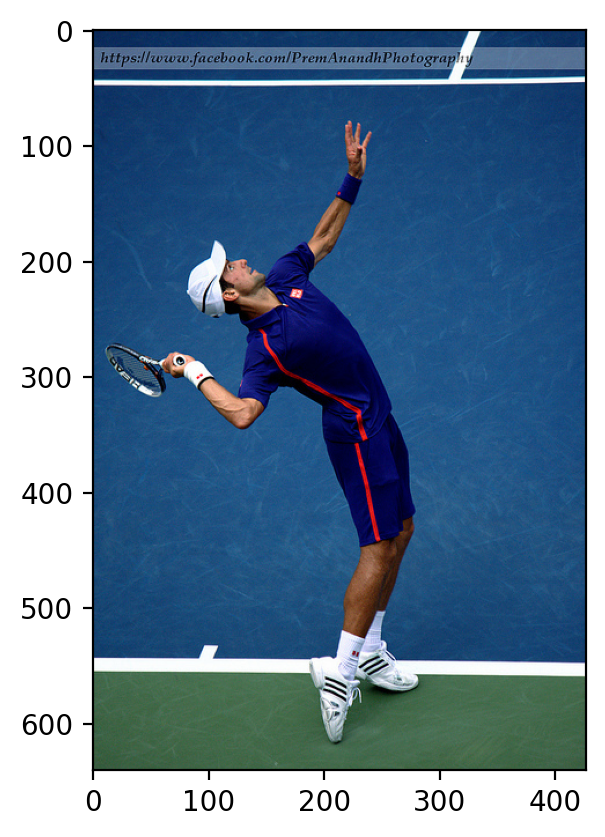

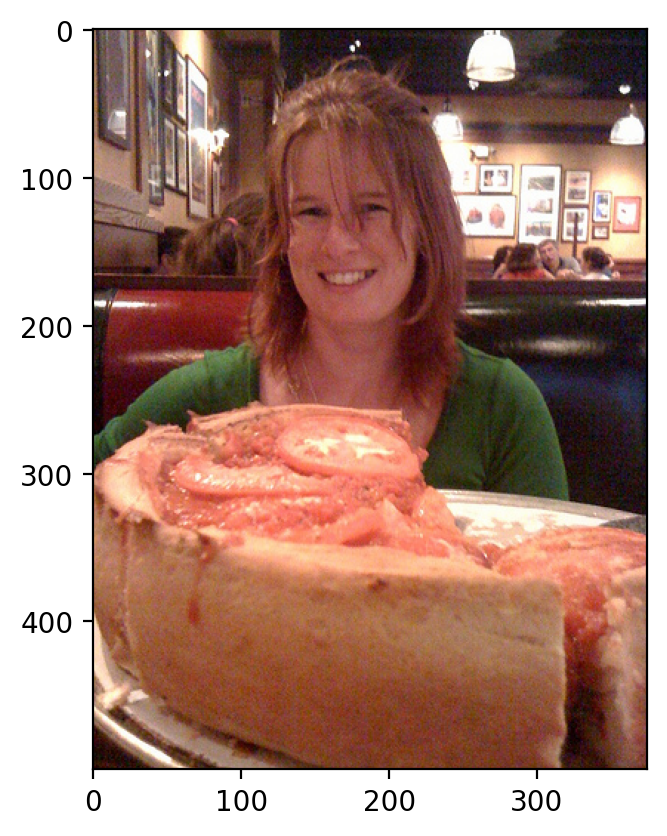

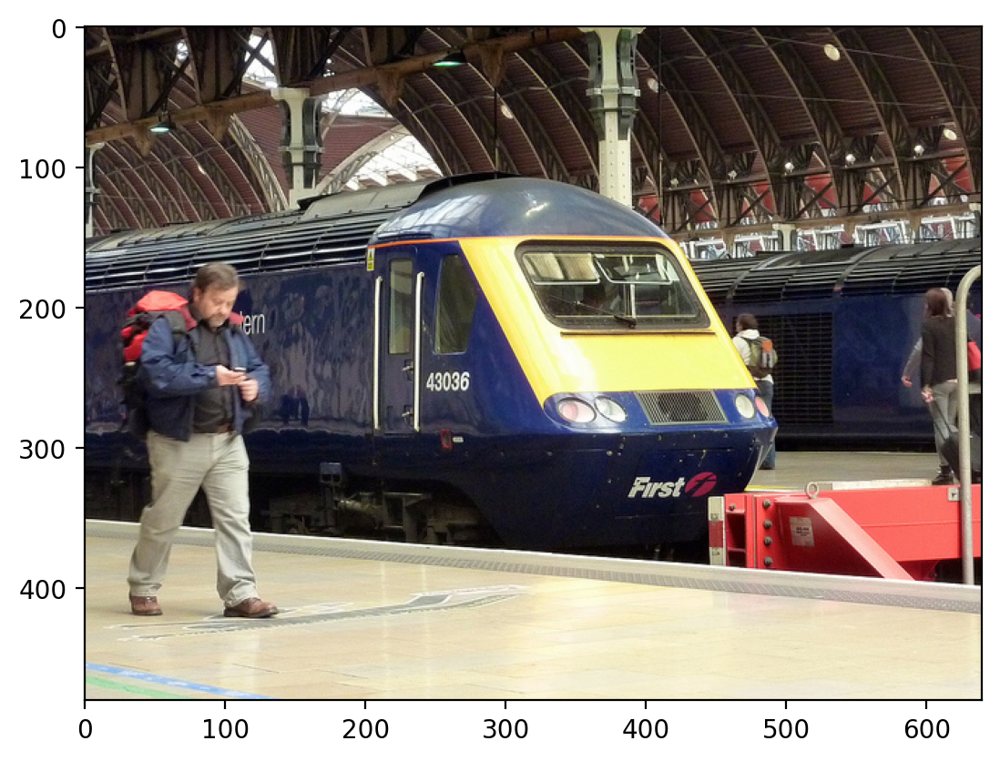

In [22]:
import cv2, random
import numpy as np
from PIL import Image
from datasets.utils.vcoco_utils import valid_obj_ids, get_coco_instance_ID_to_name, coco_class_list, vcoco_obj_text_label, vcoco_hoi_text_label
from matplotlib import pyplot as plt

def random_color():
    rdn = random.randint(1, 1000)
    b = int(rdn * 997) % 255
    g = int(rdn * 4447) % 255
    r = int(rdn * 6563) % 255
    return b, g, r

# hoi_text_inputs = torch.cat([clip.tokenize(vcoco_hoi_text_label[id]) for id in vcoco_hoi_text_label.keys()])

images = []
origin_images = []
prompts = []
for dataloader, dataset_name in zip(test_data_loader, dataset_names):
    with torch.no_grad():
        for idx, batches in enumerate(dataloader):
            prompt = []
            if idx >= 8:
                break
            for batch_idx, batch_per_image in enumerate(batches):
                filename = batch_per_image['instances']['filename'][3:]
                gts = batch_per_image['instances']['labels']
                hois = batch_per_image['instances']['hois']
                for hoi in hois:
                    verb = hoi.numpy()[-1]
                    obj = int(gts[hoi.numpy()[1]].numpy())
                    test = (verb, obj)
                    if test in list(vcoco_hoi_text_label.keys()):
                        prompt.append(vcoco_hoi_text_label[test])
                
                text = random.choice(prompt)

                image = Image.open(os.path.join(home_dir, filename)).convert("RGB")
                origin_images.append(image)
                images.append(preprocess(image))
                # plt.title(text)
                plt.imshow(image)
                plt.show()
                
            prompts.append(text)
                

In [23]:
image_input = torch.tensor(np.stack(images)).cuda()

text_descriptions = [vcoco_hoi_text_label[label] for label in vcoco_hoi_text_label]
text_tokens = clip.tokenize(text_descriptions).cuda()

with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    image_features /= image_features.norm(dim=-1, keepdim=True)

    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)


In [24]:
image_features.shape, text_features.shape

(torch.Size([8, 512]), torch.Size([263, 512]))

In [25]:
text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)

In [26]:
text_probs.shape

torch.Size([8, 263])

In [27]:
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

In [28]:
top_probs.shape, top_labels.shape

(torch.Size([8, 5]), torch.Size([8, 5]))

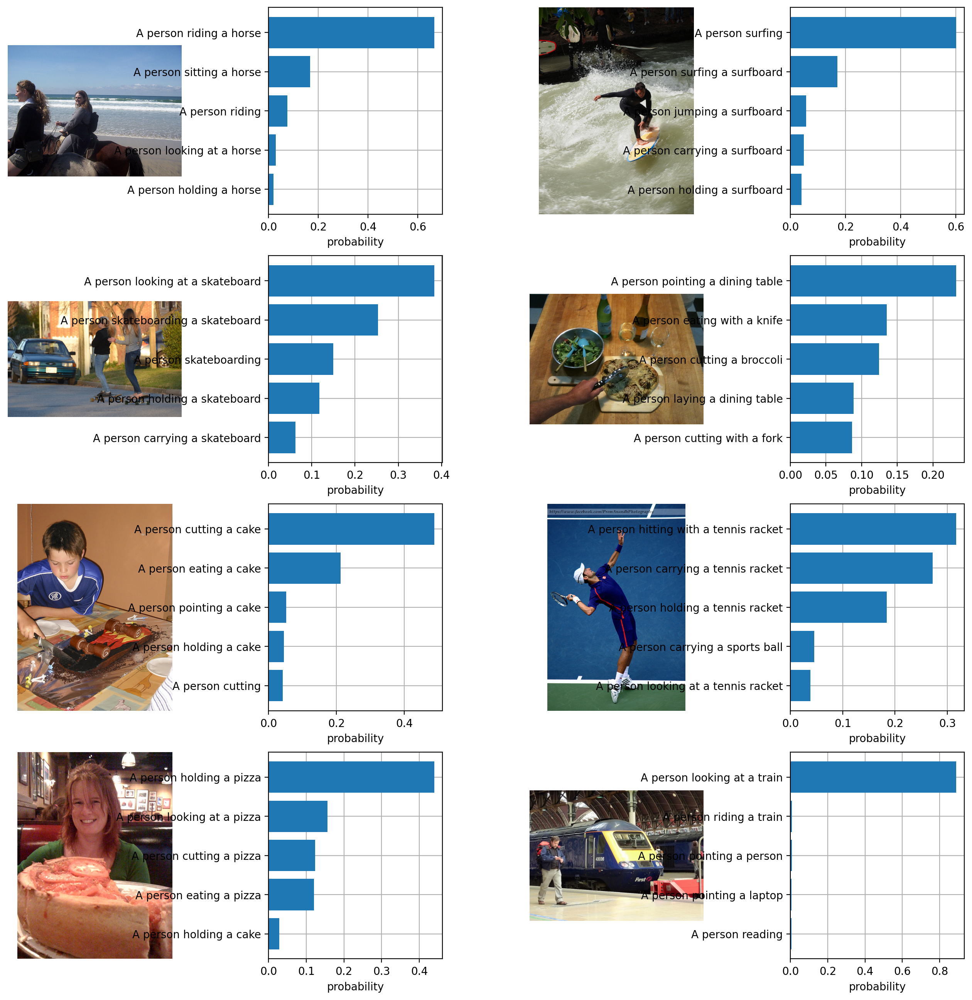

In [29]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(origin_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    # print([index for index in top_labels[i].numpy()])
    plt.yticks(y, [text_descriptions[index].replace("a photo of a", "A") for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()